## Run TensionMap to infer cell pressure, cell junction tensions and cellular stress tensor

- Read in segmented image and process to create cell boundary mask with 1px-wide, 4-connected boundaries
- Identify internal holes within tissue region
- Run TensionMap on processed mask
- Use inbuilt plotting functions in TensionMap to plot pressure, tension, and stress tensor

### Imports and data input

Select dataset - can be one of `dataset1`, `dataset2`, `dataset3`

In [1]:
dataset = 'dataset3'

In [2]:
import sys
import scipy.stats
sys.path.append('/Users/ruiyanghe/Desktop/Uni/PartIII/Project/TensionMap')
from src.segment import Segmenter
from src.VMSI import *
import numpy as np
import matplotlib.pyplot as plt
import skimage
import pandas as pd

/Users/ruiyanghe/opt/anaconda3/envs/tensionmap-new/lib/python3.9/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.17.3 and <1.25.0 is required for this version of SciPy (detected version 1.25.2
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


#### Data import

In [3]:
mask = skimage.io.imread(f'../reproduce_data/{dataset}/segmentation_final.tif')

### Process segmentation mask

Convert segmentation mask to boundary mask with 1px, 4-connected cell boundaries

In [6]:
mask = mask.astype(int)
mask = skimage.segmentation.find_boundaries(mask, mode='subpixel')

Process mask and detect holes in tissue

In [8]:
mask = 1-mask
mask = skimage.measure.label(mask)

# Detect holes
# holes are defined as tissue regions with area greater than 2x the mean cell area
holes_mask = np.zeros_like(mask)
areas = pd.DataFrame(skimage.measure.regionprops_table(label_image=mask, properties=('label','area')))
thresh = np.mean(areas['area'].tolist())*2
for area in areas.iterrows():
    if area[1]['area'] > thresh:
        holes_mask[mask==area[1]['label']] = 1

Plot processed segmentation mask. \
Format:
- 1px, 4-connected boundaries denoted by value `0`
- Background denoted by value `1`
- Unique integer value >= 2 for each segmented cell 

`skimage.segmentation.find_boundaries` is quite slow, other methods for generating the mask are fine as long as the resulting mask matches the format above.

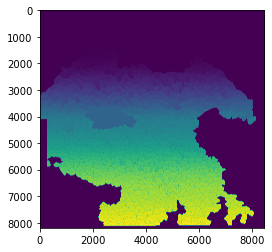

In [9]:
plt.imshow(mask)

Plot additional mask denoting where internal holes are present within the tissue. \
Format:
- Holes denoted by value `1`
- Segmented cells and boundaries denoted by value `0` \

It is not necessary to provide this mask if there are no internal holes present in the image

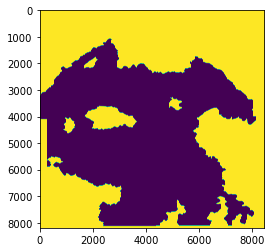

In [10]:
plt.imshow(holes_mask)

### Perform stress inference with TensionMap

Notes:

- Image tiling for large images is currently implemented (to use, set `tiling = True`) but not recommended for images with spatial homogeneity of cell morphology
- Inference was originally performed with the matlab `fmincon` optimiser (option `optimiser = 'matlab'`). This option is retained here for reproducibility. Available options are:
    - `matlab`: used in original publication of VMSI method. Best optimiser for speed and robustness but requires valid MATLAB license.
    - `cyipopt`: open-source interior-point optimiser, equivalent robustness of `matlab` optimiser but slower.
    - `nlopt`: open-source augmented lagrangian optimiser, faster than `cyipopt` but not recommended due to instability.

In [11]:
# Perform force inference on mask
model = run_VMSI(mask, is_labelled=True, holes_mask=holes_mask, tile=False, verbose=False, optimiser='matlab')

### Plot inferred mechanical quantities

#### Pressure map

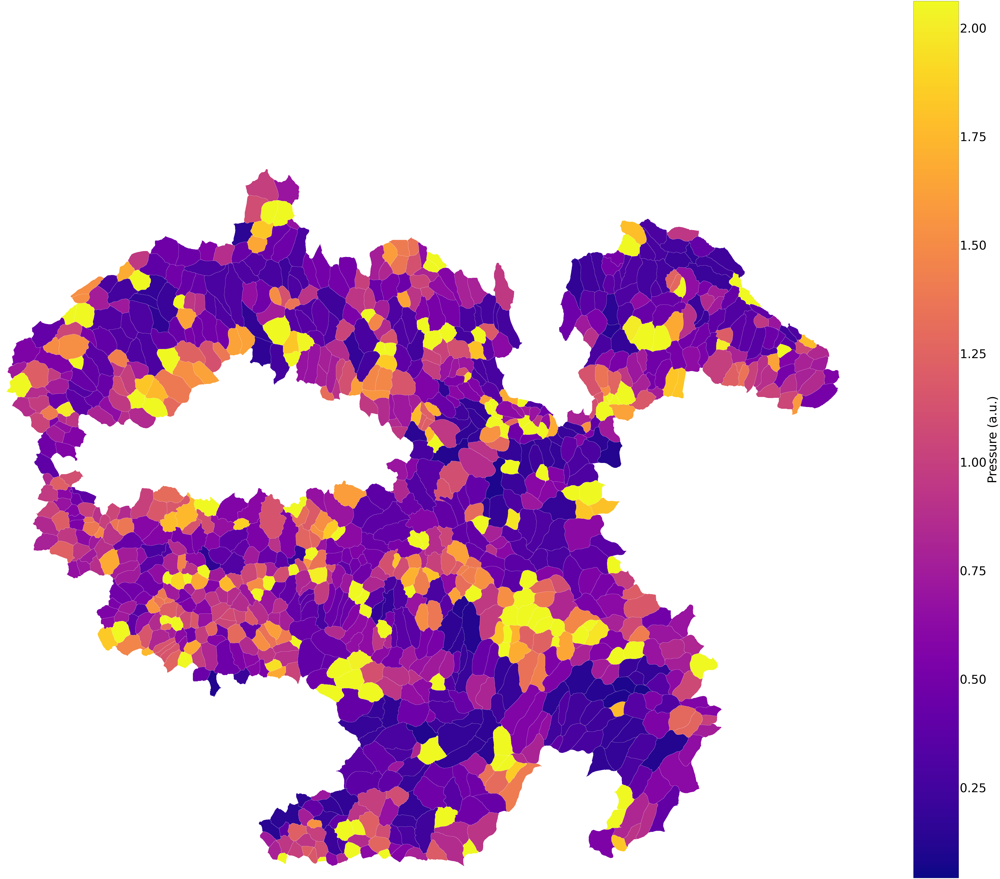

In [12]:
model.plot(['pressure'], mask, size=80)

#### Tension map

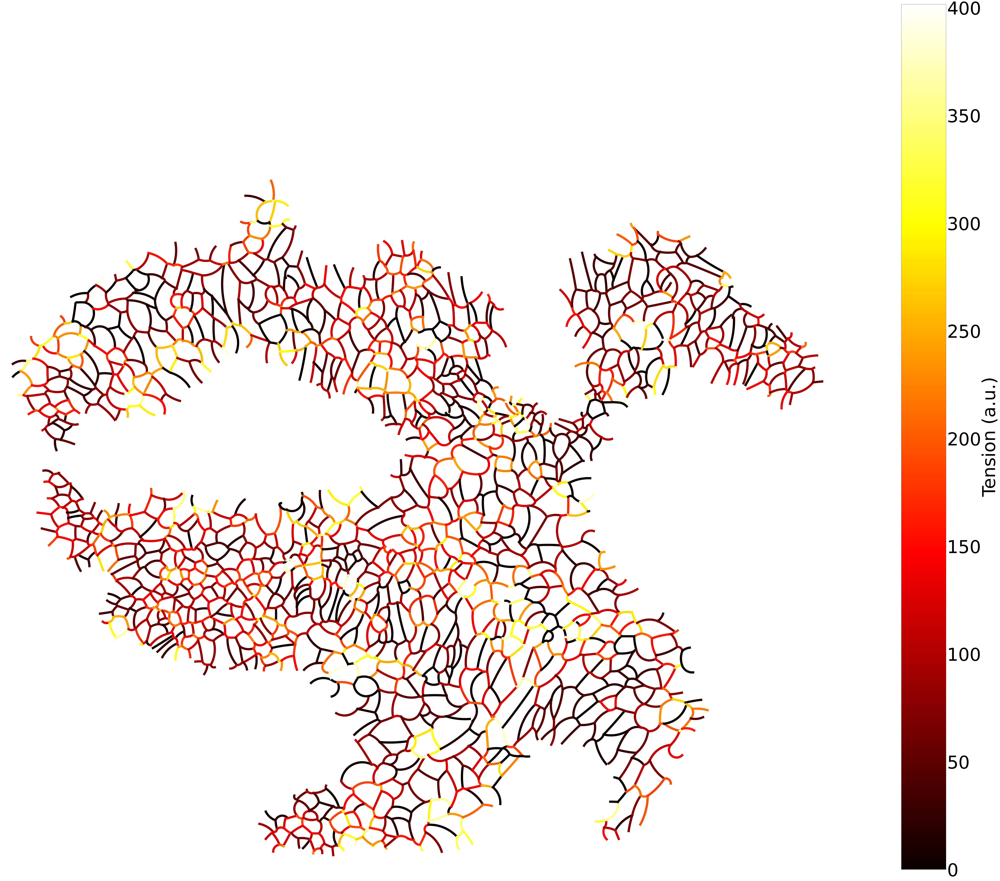

In [20]:
model.plot(['tension'], line_thickness=15, size=120)

#### Stress tensor map

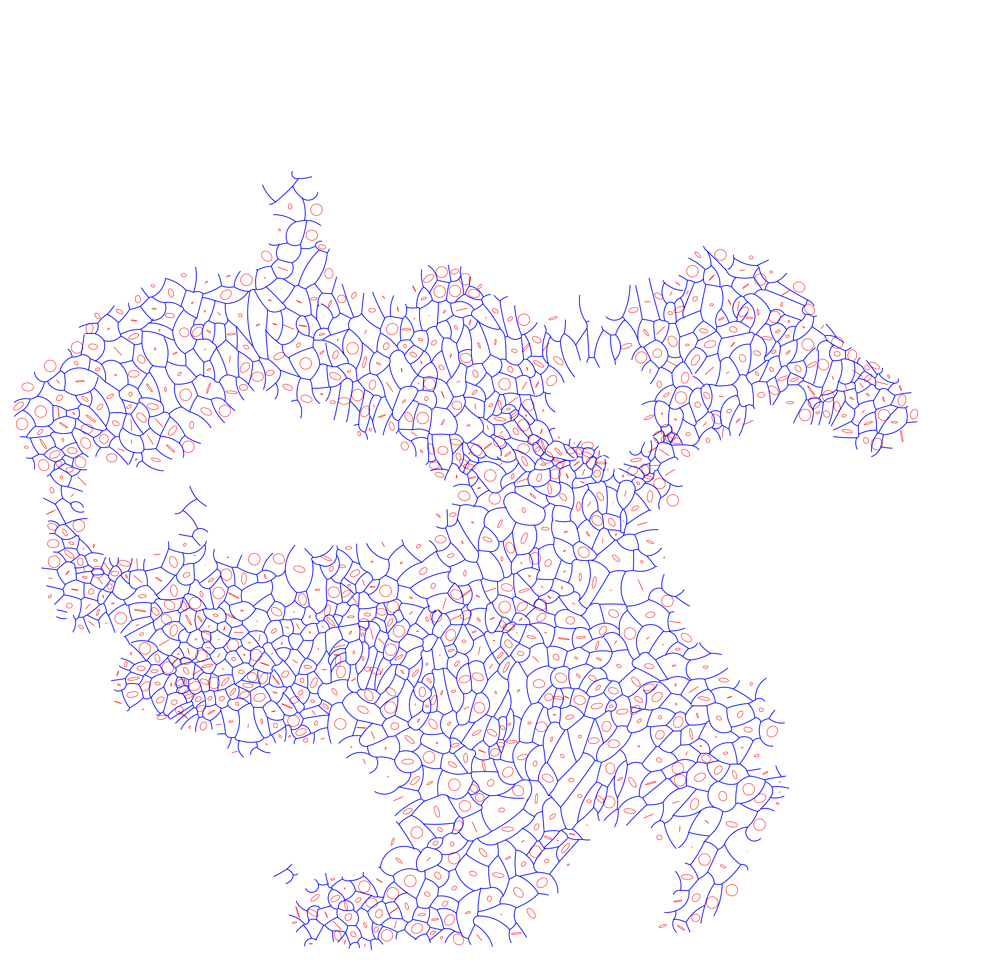

In [21]:
model.plot(['stress', 'CAP'])